In [46]:
import polars as pl
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from datetime import datetime as dt
import datetime
import pytz

In [47]:
boxes = pl.read_parquet('predictions.parquet')
img_index = pl.read_parquet('image_index.parquet')

In [48]:
img_index.head()

path,date_folder,timestamp,location,image_id
str,str,i64,str,str
"""../image_downloader/images/202…","""2025-04-20""",1745143200,"""MC_DHPOS""","""1745143200_MC_DHPOS"""
"""../image_downloader/images/202…","""2025-04-20""",1745143200,"""MC_DHService1""","""1745143200_MC_DHService1"""
"""../image_downloader/images/202…","""2025-04-20""",1745143200,"""MC_DHService2""","""1745143200_MC_DHService2"""
"""../image_downloader/images/202…","""2025-04-20""",1745143200,"""MC_DHSmoothies""","""1745143200_MC_DHSmoothies"""
"""../image_downloader/images/202…","""2025-04-20""",1745143200,"""MC_Exit1""","""1745143200_MC_Exit1"""


In [49]:
img_index = img_index.with_columns(
    dt = pl.from_epoch('timestamp', time_unit='s').dt.convert_time_zone('America/New_York')
)
img_index = img_index.with_columns(
    week = pl.col('dt').dt.week()
)

img_index = img_index.filter(
    pl.col('dt').dt.week() >= 14
)

In [50]:
boxes = img_index.join(boxes, on='image_id', how='left')

In [51]:
import json
with open('../image_downloader/secrets/cameras.json') as f:
    cams = json.load(f)

for cam in cams:
    cam['location'] = cam['url'].split('/')[-1].split('.')[0]

cams = pl.DataFrame(cams)

cams = cams.rename({'name': 'location_name'})
cams = cams.drop(['class'])

cams

location_name,url,location
str,str,str
"""Mount Carmel Dining Hall Check…","""https://checkthewait.qu.edu/ca…","""MC_DHPOS"""
"""Mount Carmel Dining Hall""","""https://checkthewait.qu.edu/ca…","""MC_DHService1"""
"""Mount Carmel Dining Hall""","""https://checkthewait.qu.edu/ca…","""MC_DHService2"""
"""Mount Carmel Dining Hall Smoot…","""https://checkthewait.qu.edu/ca…","""MC_DHSmoothies"""
"""Mount Carmel Exit""","""https://checkthewait.qu.edu/ca…","""MC_Exit1"""
…,…,…
"""North Haven Dining Hall Checko…","""https://checkthewait.qu.edu/ca…","""NH_DHPOS1"""
"""North Haven Dining Hall Checko…","""https://checkthewait.qu.edu/ca…","""NH_DHPOS2"""
"""North Haven Dining Hall Checko…","""https://checkthewait.qu.edu/ca…","""NH_DHPOS3"""


In [ ]:
'''
interesting locations:
MC_DHService2
MC_DHSmoothies
MC_Exit1
MC_Piazza
MC_PO2
MC_DHService1
NH_DHDeli
'''

In [74]:
import numpy as np

location = 'MC_Exit1'
base_img = mpimg.imread(f'template_images/{location}.jpg')
height, width = base_img.shape[:2]

location_name = cams.filter(pl.col('location') == location).select('location_name').to_series()[0]

fboxes = boxes.filter(
    (pl.col('dt').dt.week() == 15) &
    (pl.col('dt').dt.weekday() == 2) &
    (pl.col('location') == location)
).drop_nulls(
    ['x1', 'y1', 'x2', 'y2', 'confidence']
)

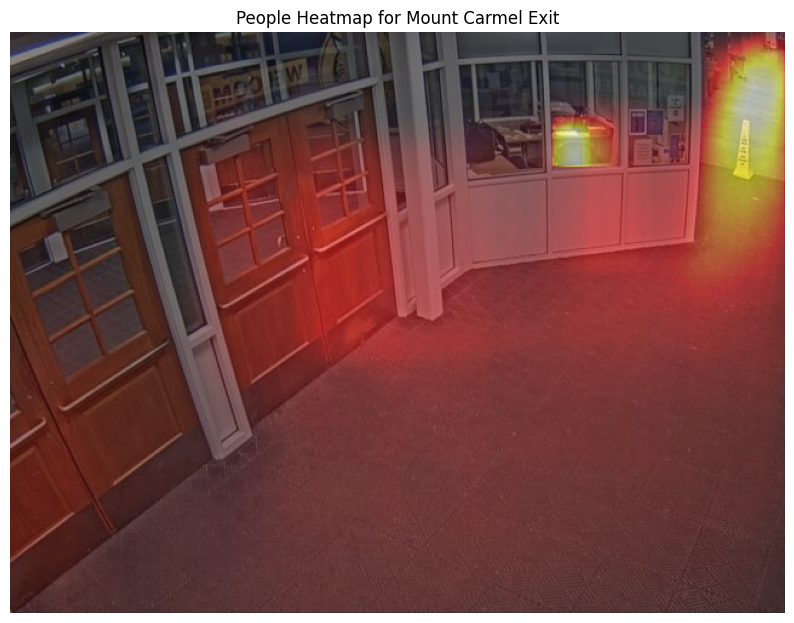

In [75]:
heatmap = np.zeros((height, width), dtype=np.float32)

fboxes_pd = fboxes.to_pandas()

for _, row in fboxes_pd.iterrows():
    x1, y1, x2, y2 = map(int, [row['x1'], row['y1'], row['x2'], row['y2']])
    heatmap[y1:y2, x1:x2] += 1

heatmap /= np.max(heatmap)

plt.figure(figsize=(10, 8))
plt.imshow(base_img)
plt.imshow(heatmap, cmap='hot', alpha=0.5)
plt.axis('off')
plt.title(f"People Heatmap for {location_name}")
plt.show()


In [ ]:
def get_heatmap(location, week, day):
    base_img = mpimg.imread(f'template_images/{location}.jpg')
    height, width = base_img.shape[:2]
    location_name = cams.filter(pl.col('location') == location).select('location_name').to_series()[0]
    fboxes = boxes.filter(
        (pl.col('dt').dt.week() == week) &
        (pl.col('dt').dt.weekday() == day) &
        (pl.col('location') == location)
    ).drop_nulls(
        ['x1', 'y1', 'x2', 'y2', 'confidence']
    )
    heatmap = np.zeros((height, width), dtype=np.float32)
    fboxes_pd = fboxes.to_pandas()
    for _, row in fboxes_pd.iterrows():
        x1, y1, x2, y2 = map(int, [row['x1'], row['y1'], row['x2'], row['y2']])
        heatmap[y1:y2, x1:x2] += 1
    heatmap /= np.max(heatmap)

    # plt.figure(figsize=(10, 8))
    # plt.imshow(base_img)
    # plt.imshow(heatmap, cmap='hot', alpha=0.5)
    # plt.axis('off')
    # plt.title(f"People Heatmap for {location_name}")
    # plt.show()
    
    return base_img, heatmap, location_name

In [88]:
def get_heatmap_week(location, week):
    base_img = mpimg.imread(f'template_images/{location}.jpg')
    height, width = base_img.shape[:2]
    location_name = cams.filter(pl.col('location') == location).select('location_name').to_series()[0]
    fboxes = boxes.filter(
        (pl.col('dt').dt.week() == week) &
        (pl.col('location') == location)
    ).drop_nulls(
        ['x1', 'y1', 'x2', 'y2', 'confidence']
    )
    heatmap = np.zeros((height, width), dtype=np.float32)
    fboxes_pd = fboxes.to_pandas()
    for _, row in fboxes_pd.iterrows():
        x1, y1, x2, y2 = map(int, [row['x1'], row['y1'], row['x2'], row['y2']])
        heatmap[y1:y2, x1:x2] += 1
    heatmap /= np.max(heatmap)
    
    return base_img, heatmap, location_name

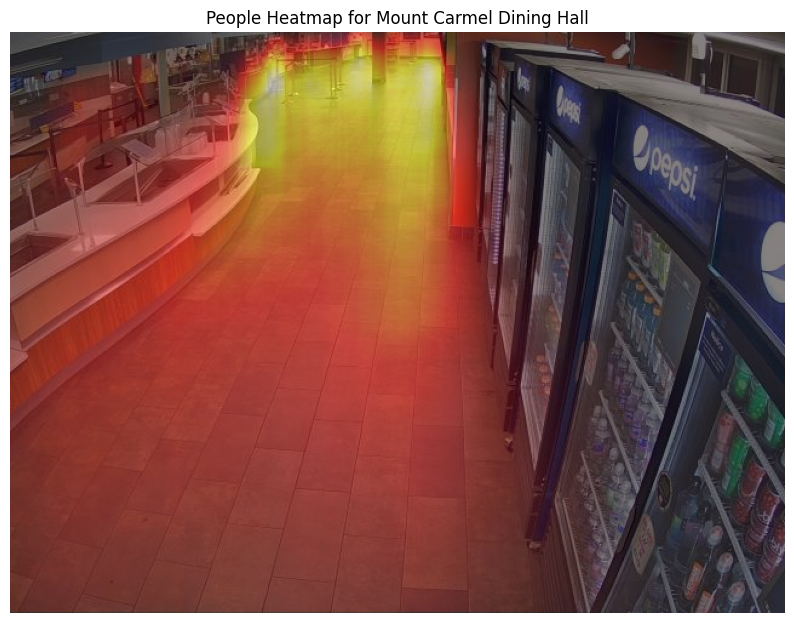

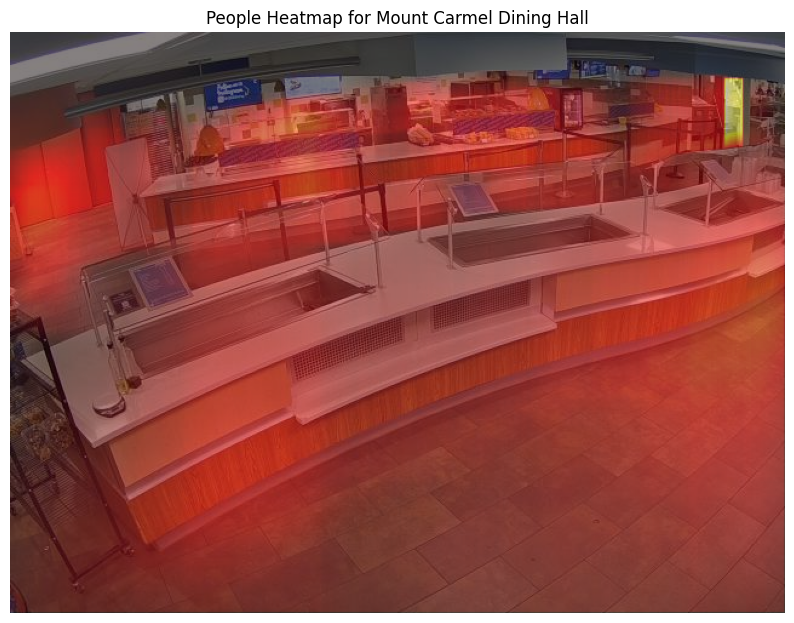

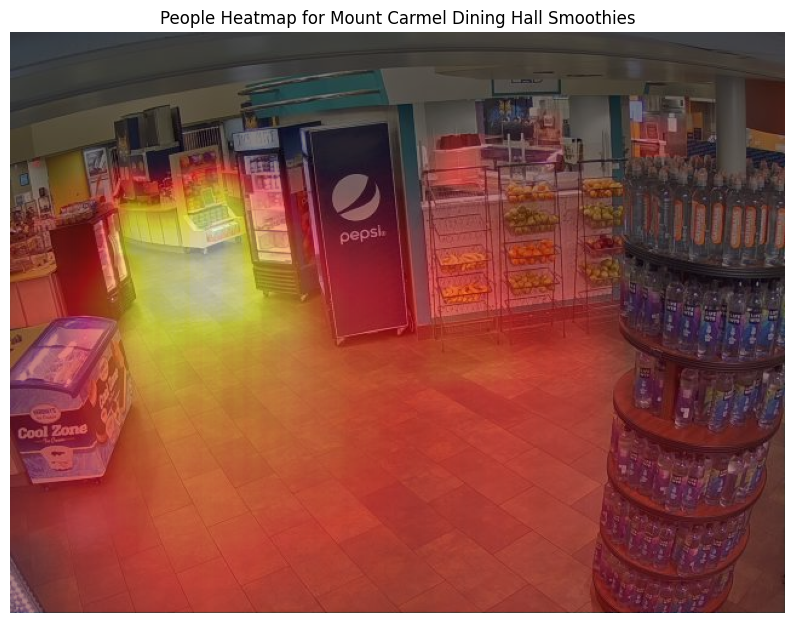

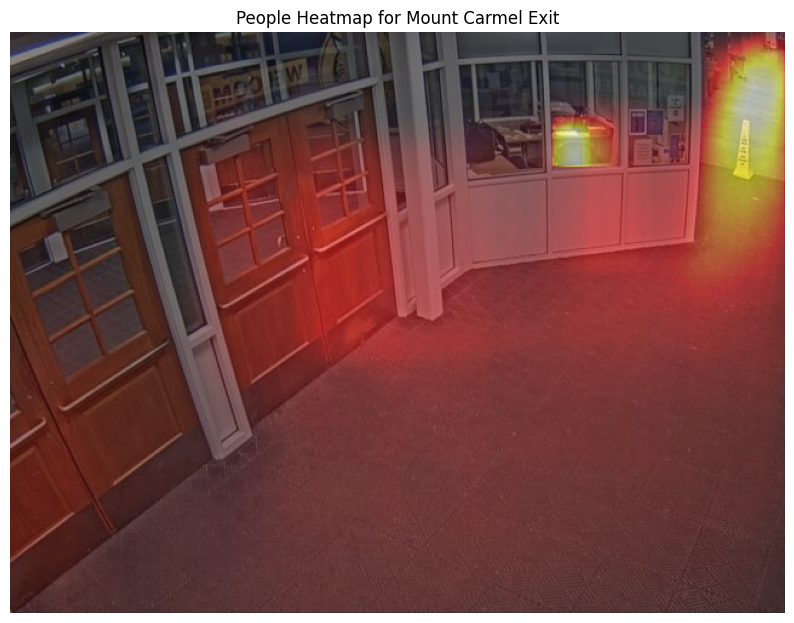

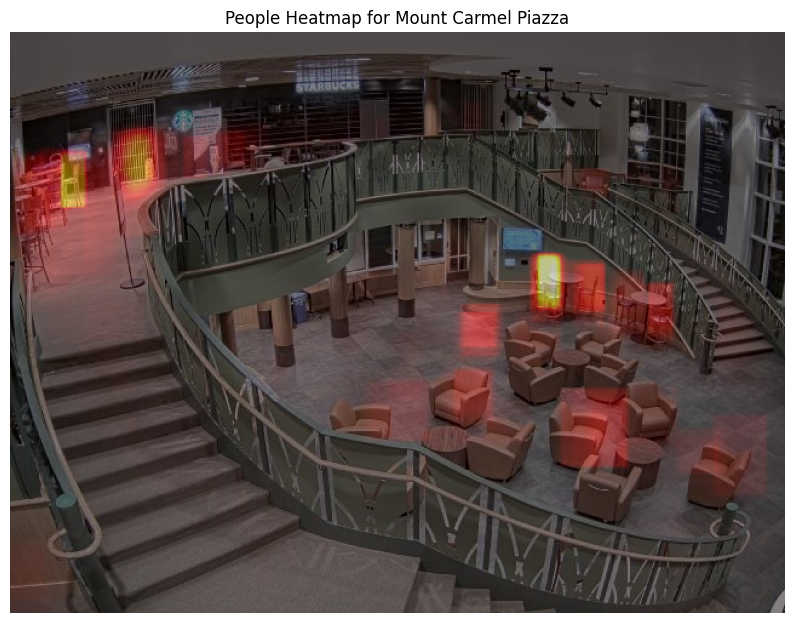

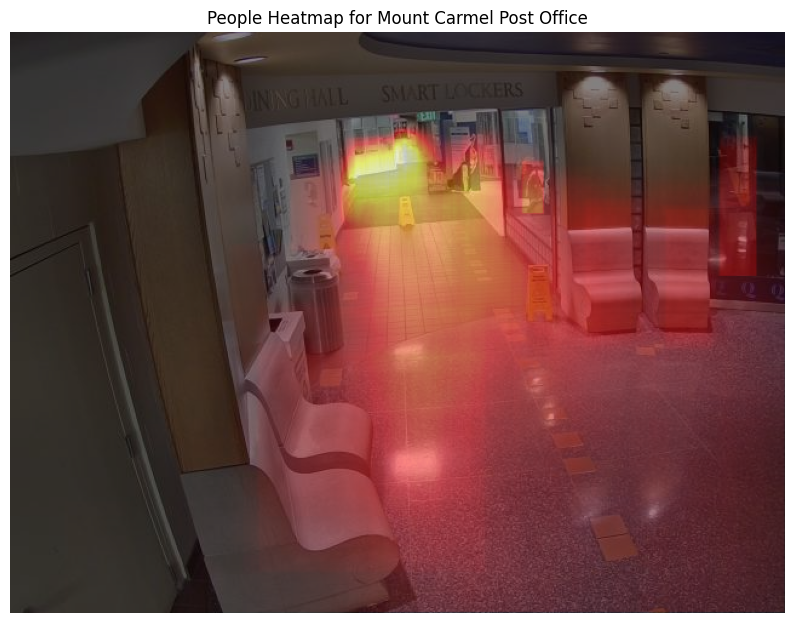

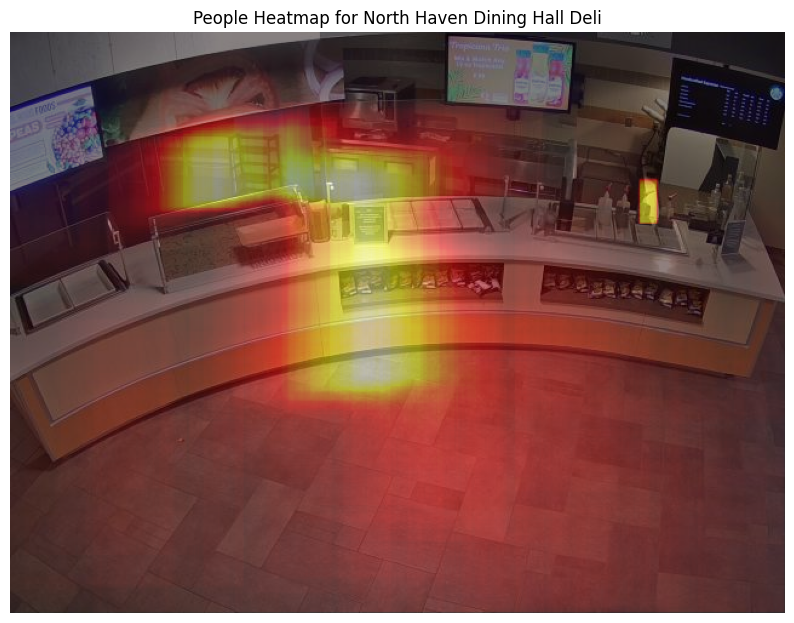

In [86]:
valid_locations = [
    'MC_DHService2',
    'MC_DHSmoothies',
    'MC_Exit1',
    'MC_Piazza',
    'MC_PO2',
    'MC_DHService1',
    'NH_DHDeli'
]

for location in cams.select('location').to_series():
    if location in valid_locations:
        base_img, heatmap, location_name = get_heatmap(location, 15, 2)
        plt.figure(figsize=(10, 8))
        plt.imshow(base_img)
        plt.imshow(heatmap, cmap='hot', alpha=0.5)
        plt.axis('off')
        plt.title(f"People Heatmap for {location_name}")
        # plt.show()
        plt.savefig(f'heatmaps/{location_name}_heatmap.png', bbox_inches='tight')

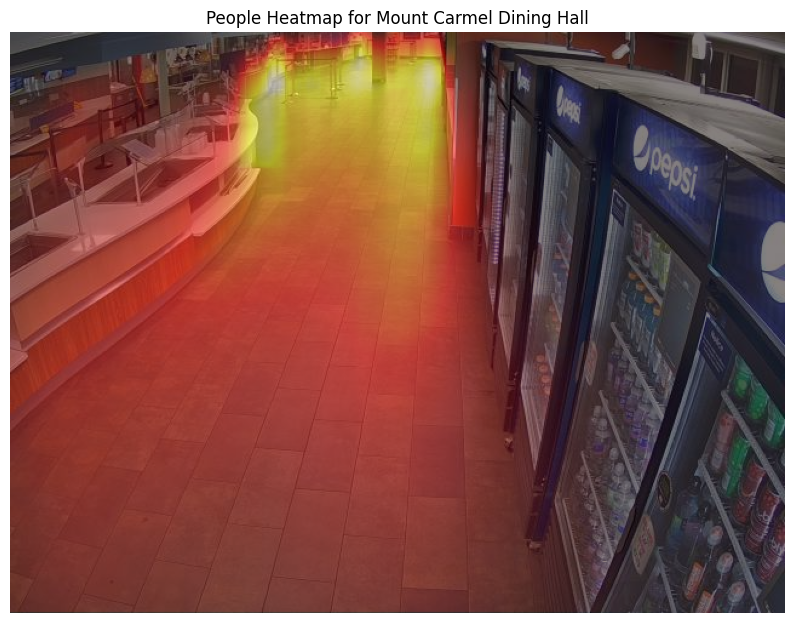

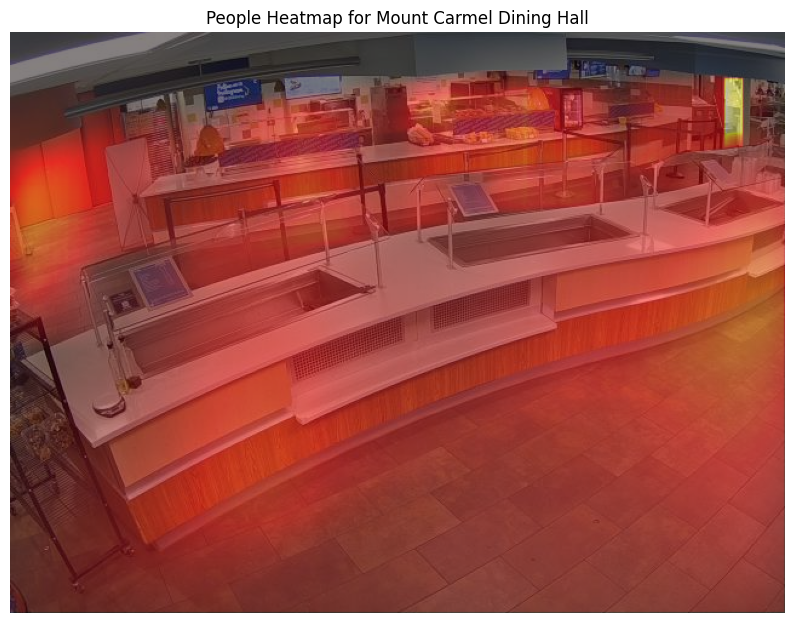

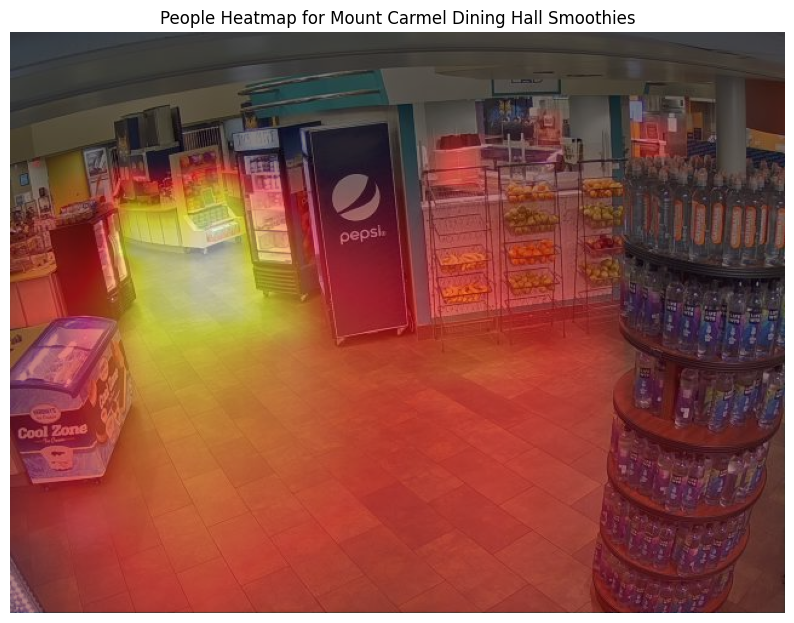

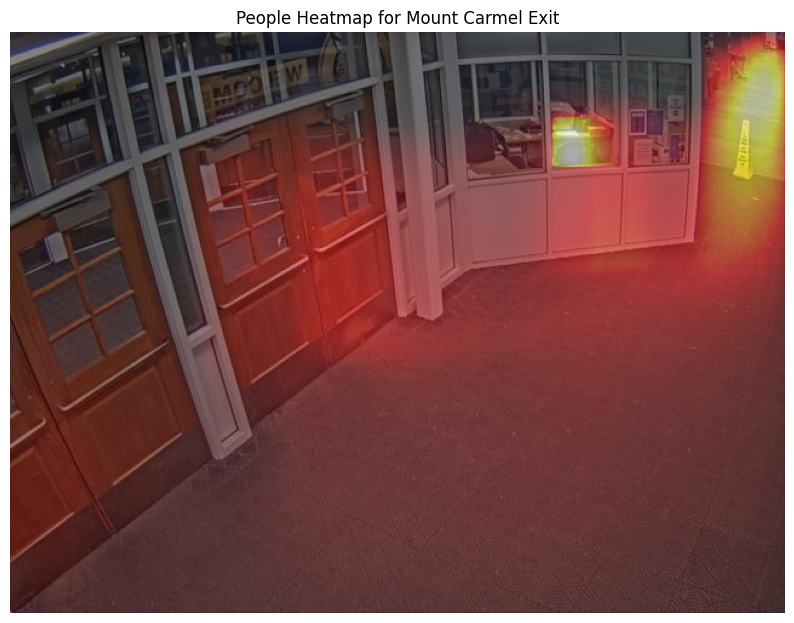

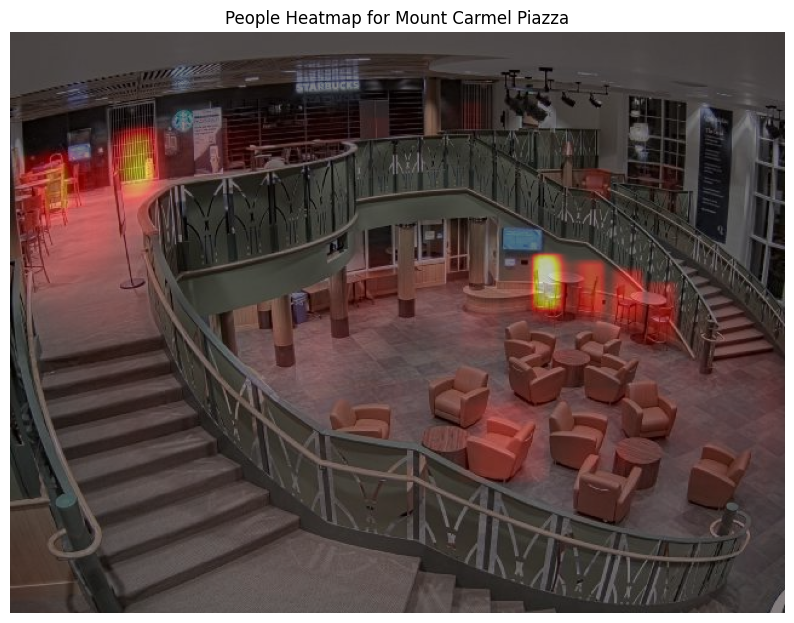

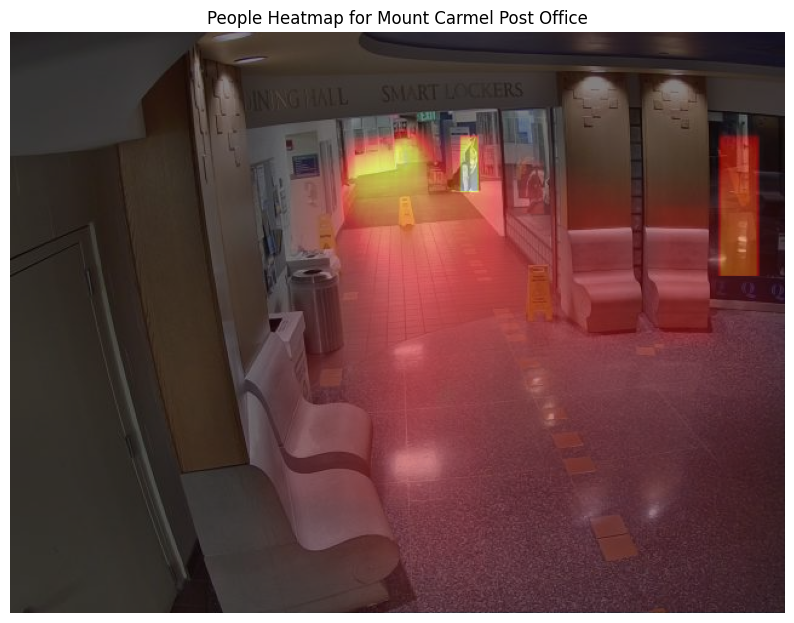

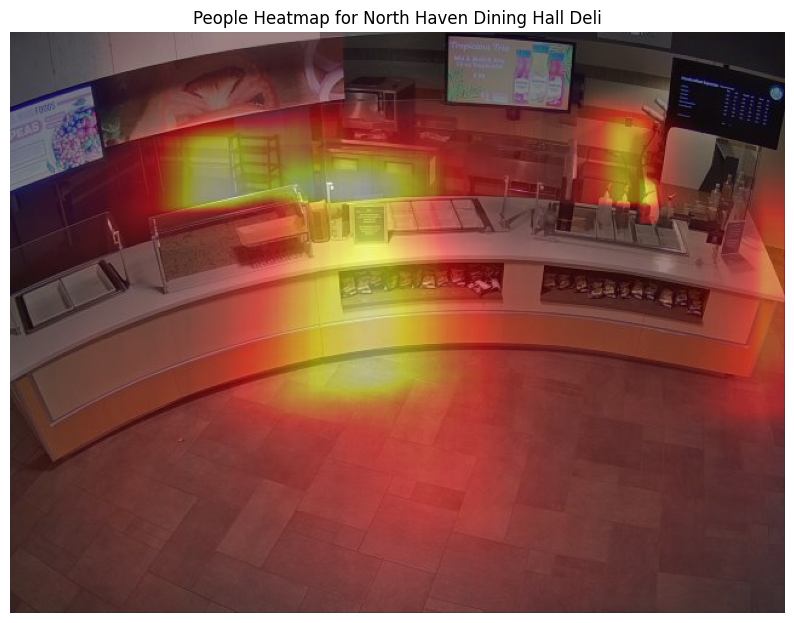

In [89]:
for location in cams.select('location').to_series():
    if location in valid_locations:
        base_img, heatmap, location_name = get_heatmap_week(location, 15)
        plt.figure(figsize=(10, 8))
        plt.imshow(base_img)
        plt.imshow(heatmap, cmap='hot', alpha=0.5)
        plt.axis('off')
        plt.title(f"People Heatmap for {location_name}")
        # plt.show()
        plt.savefig(f'heatmap_week/{location_name}_heatmap.png', bbox_inches='tight')